#### Image Processing (Blurring and Smoothing)

One of the common operation for IM is blurring or smoothing an image.

- <b> Smoothing </b>: can help get rid of noise or help an application focus on general details.
- <b> Often smoothing or clurring is combined with edge detection</b>
 - Edge Detection algorithms detect too many edges when shown a high resolution image without any blurring.

 Example:
 

##### Methods for Smoothing/Blurring

- <b> Gamma Correction </b>
 - applied to image to make it appear brighter or darker depending on the Gamma value chosen
 - $\gamma$ near to 0 lighter and greater than 1 (near to 2) more darker
- <b> Kernal Based filters </b>
 - applied over an image to produce a varitey of effects
 - An image kernel is a small matrix used to apply effects like the ones you might find in Photoshop or Gimp, such as blurring, sharpening, outlining or embossing. They're also used in machine learning for 'feature extraction', a technique for determining the most important portions of an image. In this context the process is referred to more generally as "convolution"
 - <b> Types of kernels: </b> <i> blur, bottom sobel, emboss, identity, left sobel, outline, right sobel, sharpen, top sobel </i>

In [94]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [95]:
picDefault = 'image/two-parrots.jpg'

In [96]:
#functions are important to be written for opencv as they are used again and again

#LOAD IMAGE FUNCTION:
def load_img():
  img = cv2.imread(picDefault).astype(np.float32)/255
  img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  return img

#DISPLAY IMAGE:
def display_img(img):
  fig = plt.figure(figsize=(12,10))
  ax = fig.add_subplot(111)
  ax.imshow(img)

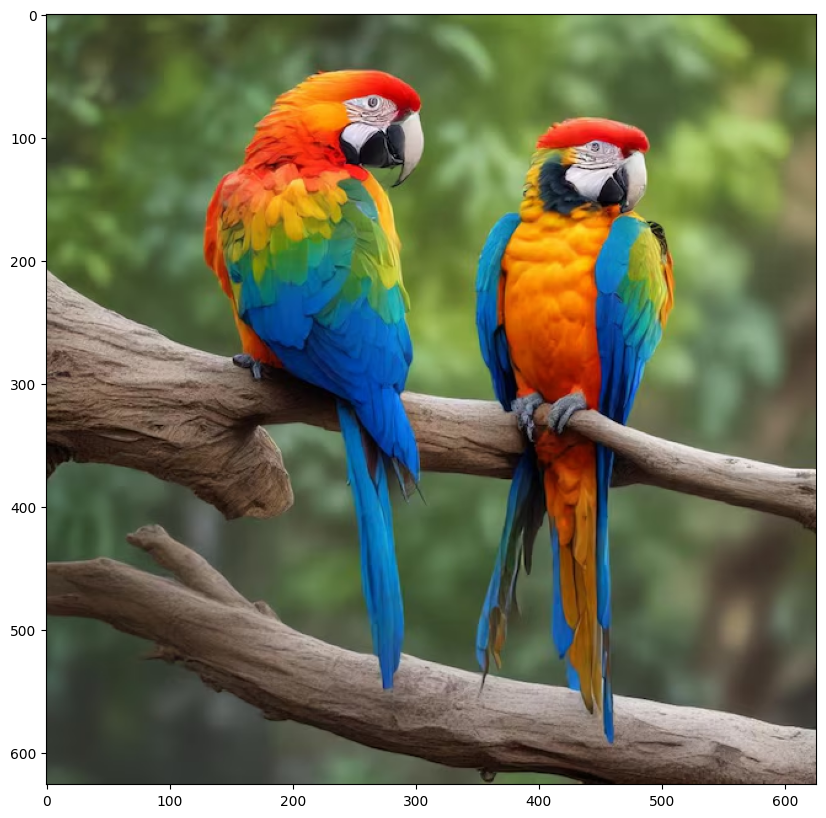

In [97]:
i = load_img()
display_img(i)

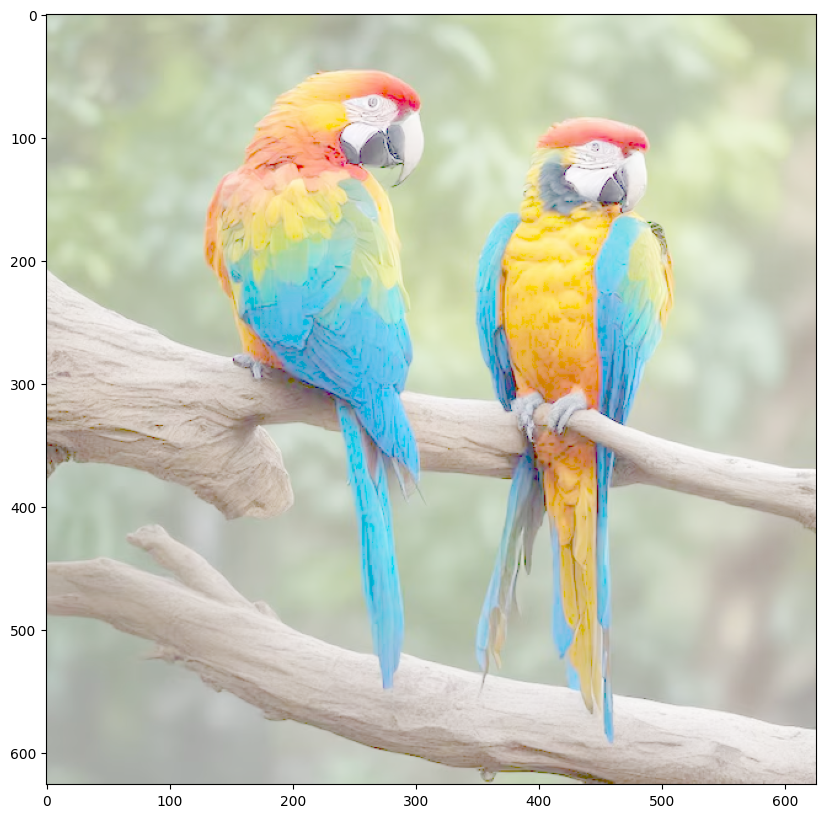

In [98]:
gamma = 1/4 #<1 (BRIGHTER IMAGE)
result = np.power(i,gamma) #take every pixel of image and raise the value of each pixel by gamma

display_img(result)

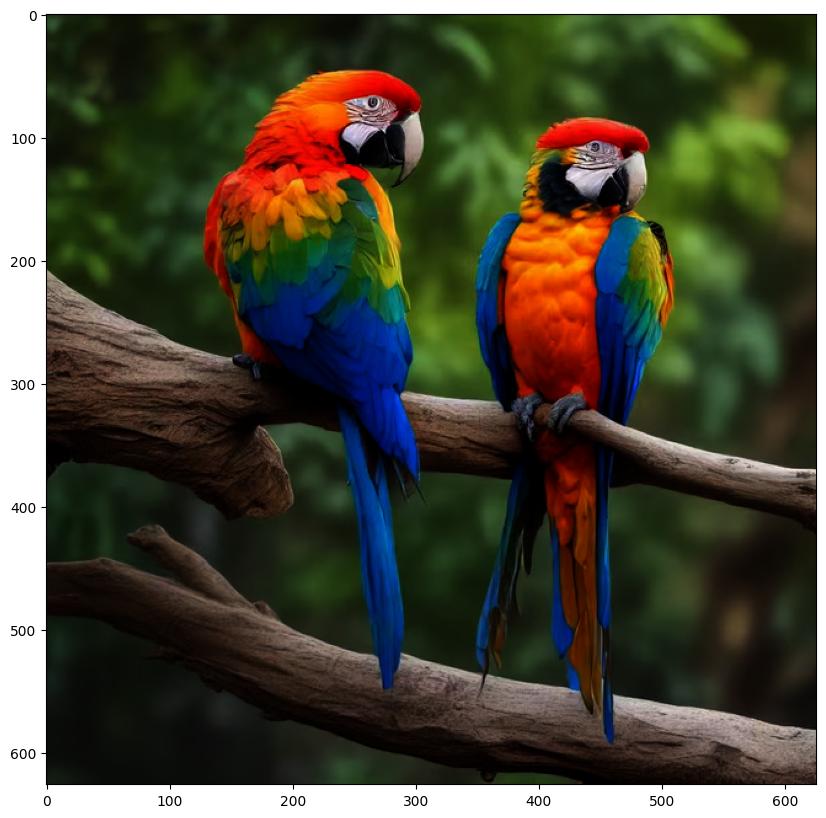

In [99]:
gamma = 2 #>1 (DARKER IMAGE)
result = np.power(i,gamma) #take every pixel of image and raise the value of each pixel by gamma

display_img(result)

##### BLURRING

Sometimes it is difficult to differentiate the blurring effect with respec to original image, so we add some text to the image to see the effect likewise

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


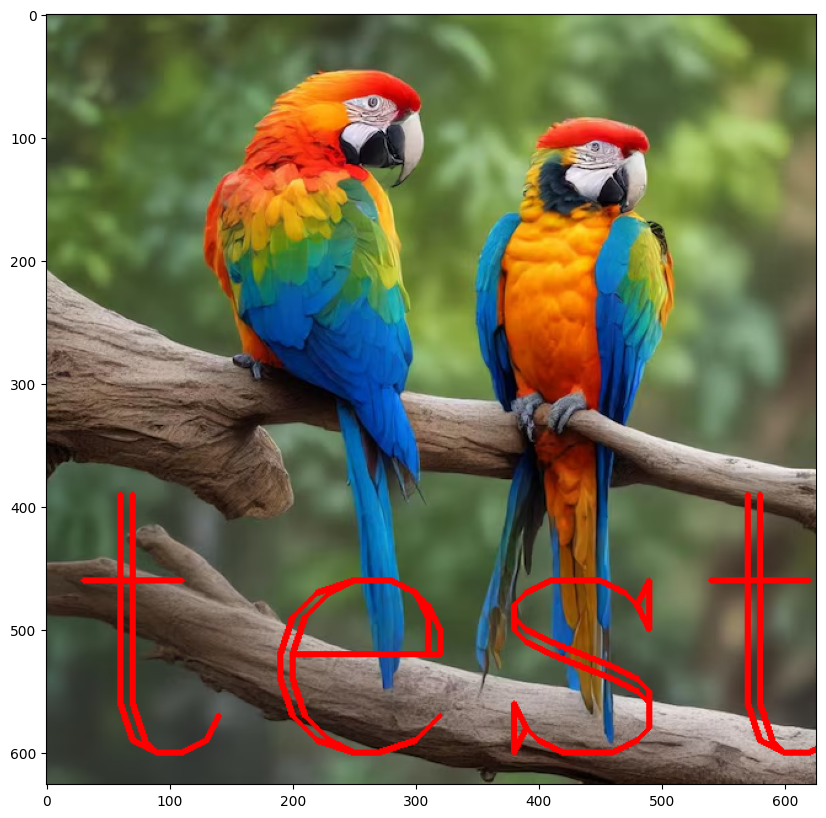

In [100]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='test',org=(10,600),
            fontFace=font,fontScale=10,
            color=(255,0,0),thickness=4)
display_img(img)

In [101]:
# Low pass filter kernel

kernel = np.ones(shape=(5,5),dtype=np.float32)/25
kernel #1/25

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..254.99995].


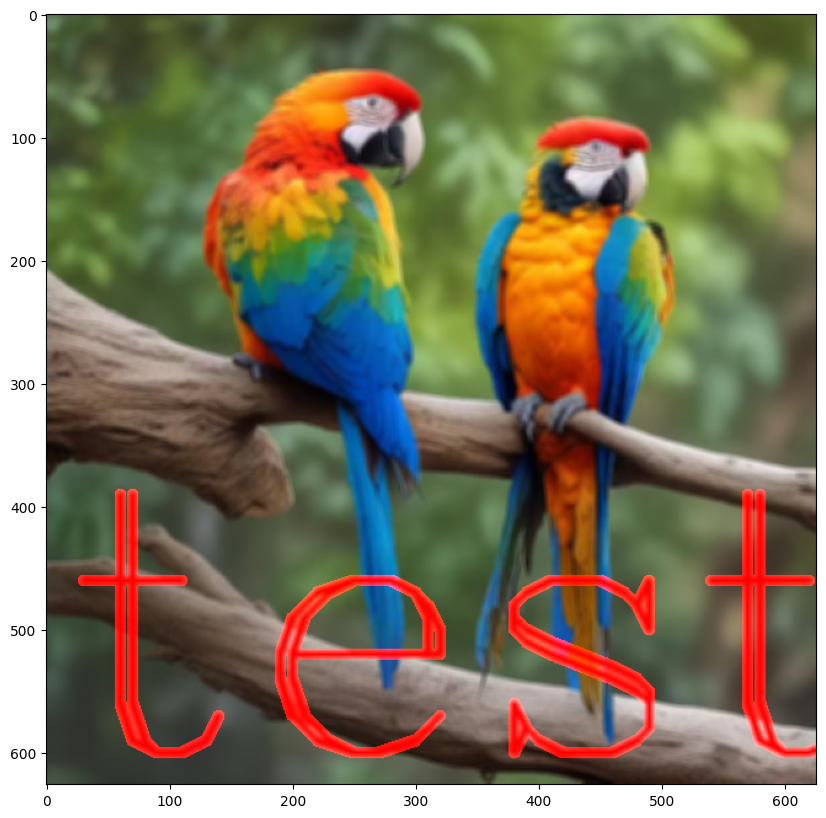

In [102]:
#apply 2D filter

dst = cv2.filter2D(img,-1,kernel) #-1 means assign input as desired output
display_img(dst)

So we can see blurring between the gaps on each letter like this:




In [103]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='Reset',org=(10,600),
            fontFace=font,fontScale=10,
            color=(255,0,0),thickness=4)
print('RESET')

RESET


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


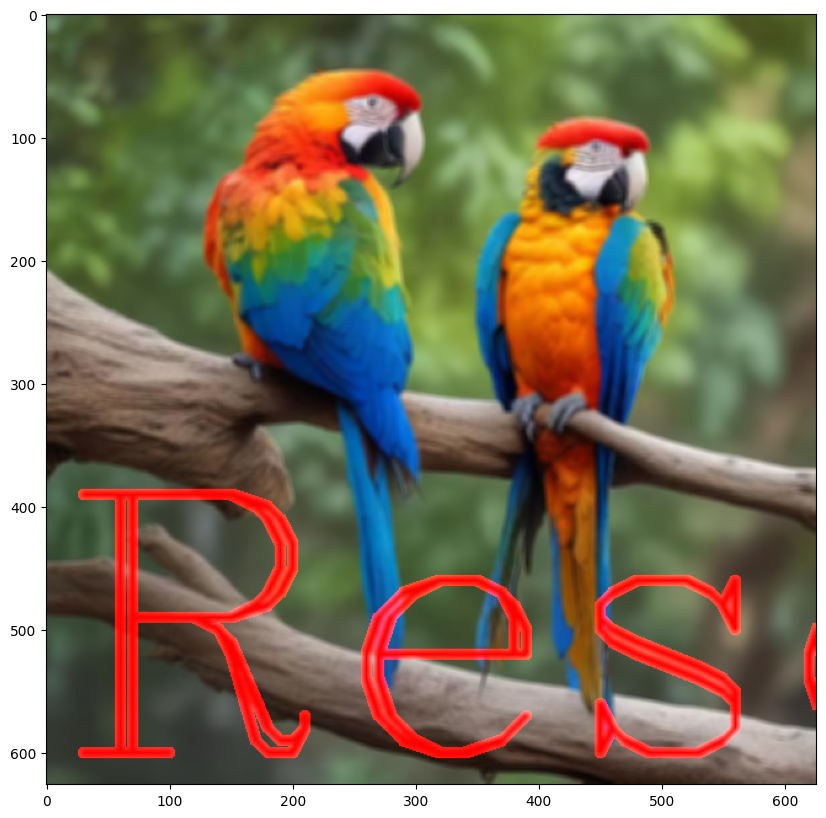

In [104]:
blur = cv2.blur(img,ksize=(5,5))
display_img(blur)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0026666669..239.7189].


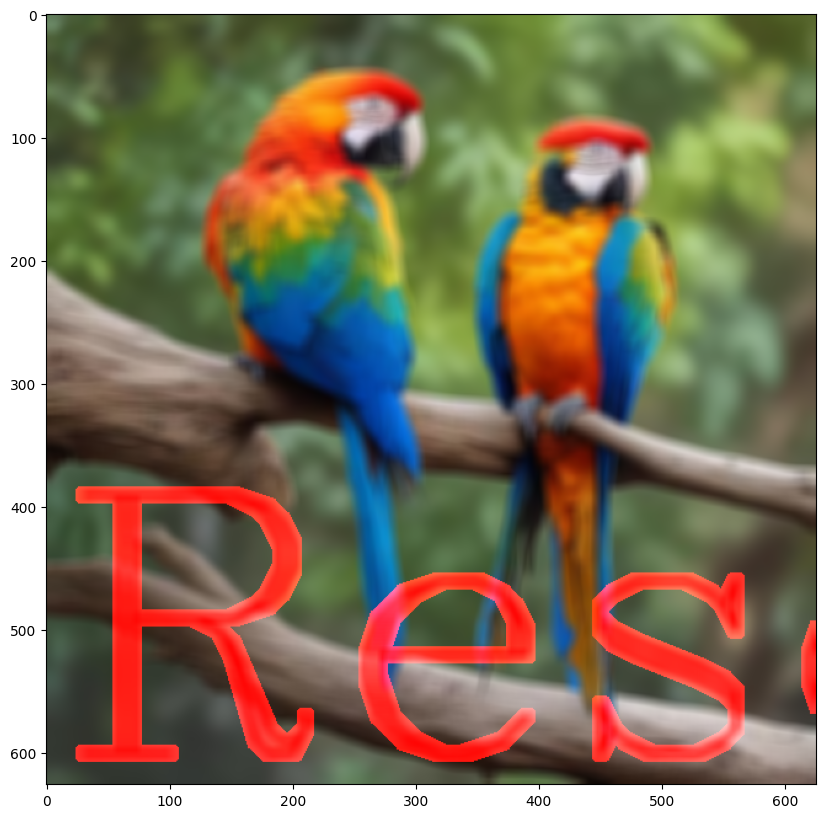

In [105]:
blur2 = cv2.blur(img,ksize=(10,10))
display_img(blur2)

Now see apply blur function directly and change the kernel size from $5 \times 5$ to $10 \times 10$ and we see we increase the blurring intensity with inc int he kernel size



Then we have <b> Gaussian Blurring </b> and <b> Median Blurring </b> that will take group of pixels and with the average there take the effect of blurring


In [106]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='G Blur',org=(10,600),
            fontFace=font,fontScale=10,
            color=(255,0,0),thickness=4)
print('RESET')

RESET


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


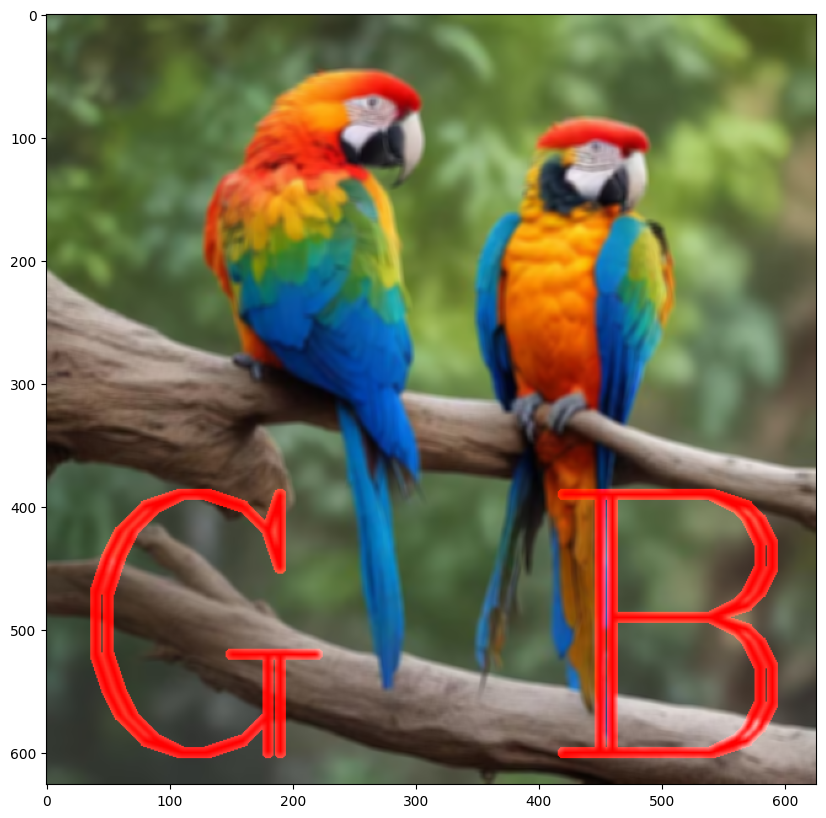

In [107]:
blurred_img = cv2.GaussianBlur(img,(5,5),sigmaX=10)
#sigmaX is standard deviation in X direction and sigmaY for y direction

display_img(blurred_img)

In [108]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='M Blur',org=(10,600),
            fontFace=font,fontScale=10,
            color=(255,0,0),thickness=4)
print('RESET')

RESET


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


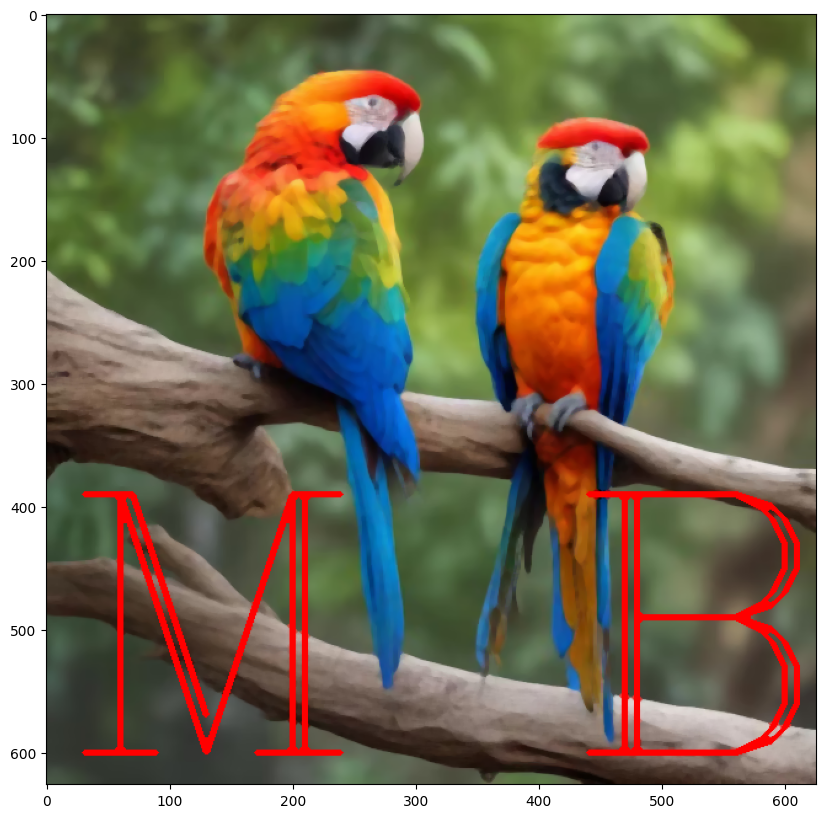

In [109]:
blurred_img2 = cv2.medianBlur(img,5)
display_img(blurred_img2)

<b> Median Blur </b> is better as it keeps the blurrness for the image as asked while keeping the details intact (details of text and reducing noise from image)

<b> Let us check more realistic image view</b>

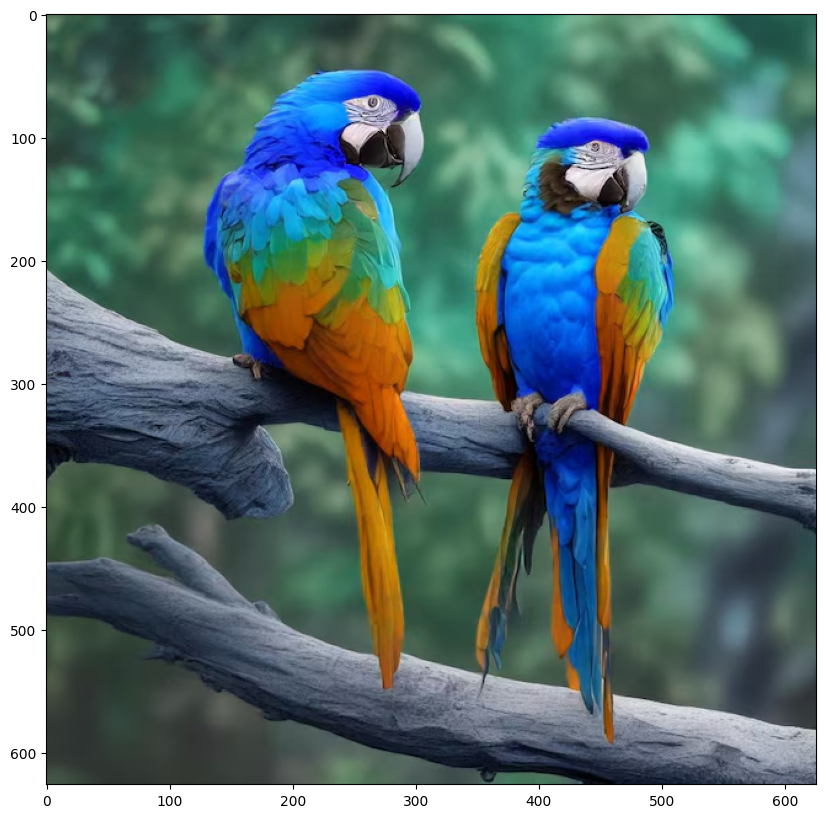

In [110]:
PicNoiseTest = 'image/two-parrots.jpg'

img_pic_noise = cv2.imread(PicNoiseTest)

display_img(img_pic_noise)

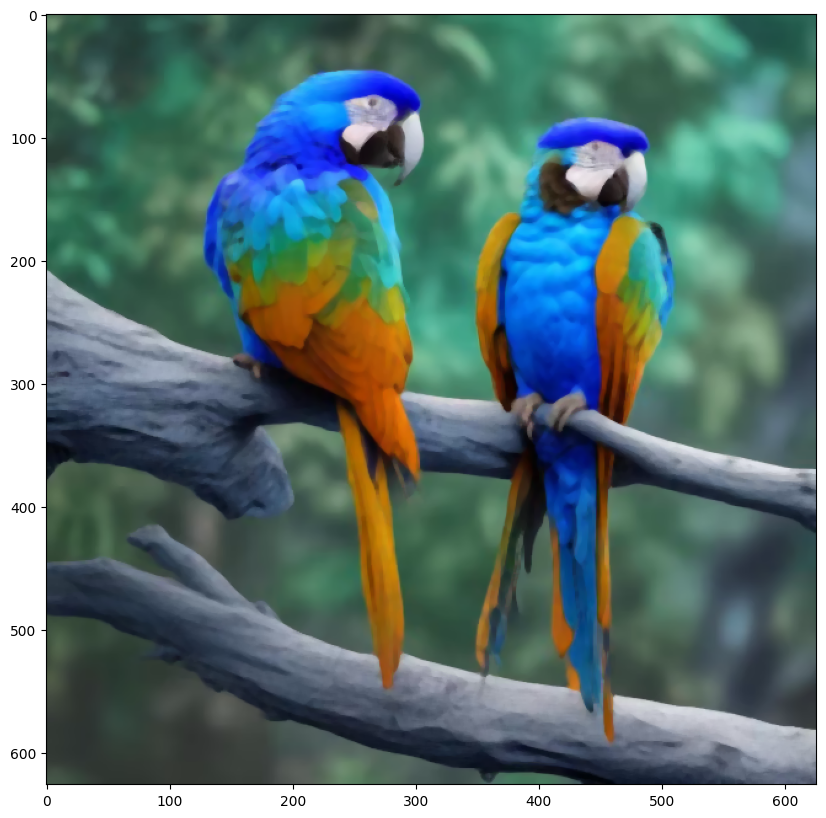

In [111]:
median = cv2.medianBlur(img_pic_noise,5)
display_img(median)

##### Bilateral filtering 

Somewhere near to median Blur result

In [112]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='B filter',org=(10,600),
            fontFace=font,fontScale=10,
            color=(255,0,0),thickness=4)
print('RESET')

RESET


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


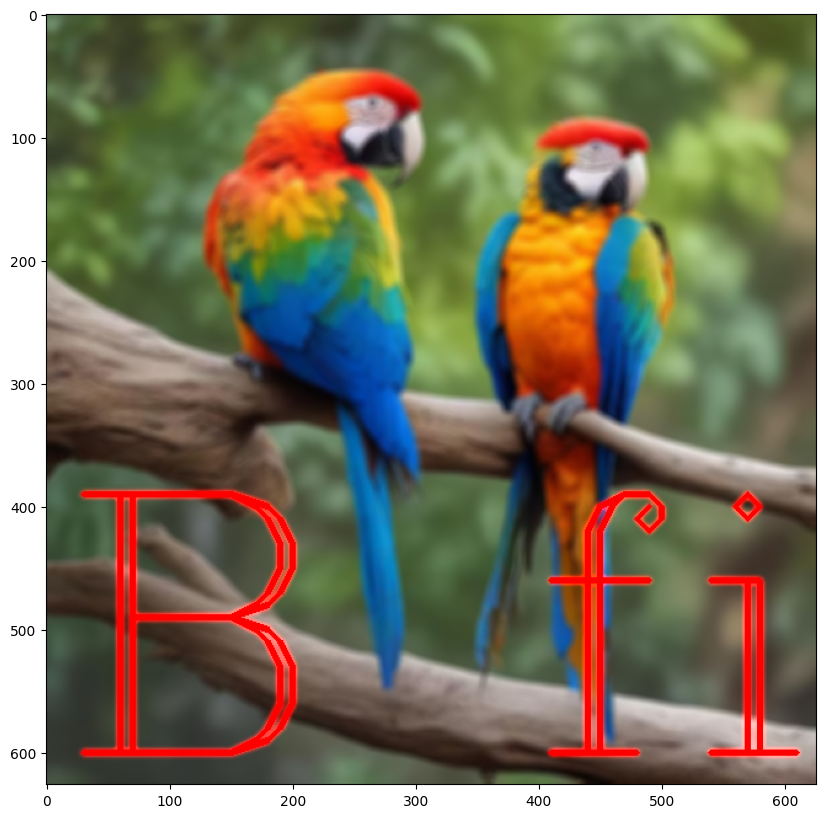

In [113]:
blur = cv2.bilateralFilter(img,9,75,75)
display_img(blur)